# **Data Cleaning of the Data**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 

In [2]:
df=pd.read_csv('training.csv')

In [3]:
df.head()

,patient_id,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
0,475714,NaN,MEDICAID,CA,924,84,F,NaN,C50919,Malignant neoplasm of unsp site of unspecified...,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
1,349367,White,COMMERCIAL,CA,928,62,F,28.49,C50411,Malig neoplm of upper-outer quadrant of right ...,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
2,138632,White,COMMERCIAL,TX,760,43,F,38.09,C50112,Malignant neoplasm of central portion of left ...,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1
3,617843,White,COMMERCIAL,CA,926,45,F,NaN,C50212,Malig neoplasm of upper-inner quadrant of left...,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,0
4,817482,NaN,COMMERCIAL,ID,836,55,F,NaN,1749,"Malignant neoplasm of breast (female), unspeci...",...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,0


In [4]:
df.dtypes

patient_id          int64
patient_race       object
payer_type         object
patient_state      object
patient_zip3        int64
                   ...   
veteran           float64
Ozone             float64
PM25              float64
N02               float64
DiagPeriodL90D      int64
Length: 83, dtype: object

In [5]:
df.describe()

,patient_id,patient_zip3,patient_age,bmi,population,density,age_median,age_under_10,age_10_to_19,age_20s,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
count,12906.000000,12906.000000,12906.000000,3941.000000,12905.000000,12905.000000,12905.000000,12905.000000,12905.000000,12905.000000,...,12905.000000,12902.000000,12902.000000,12905.000000,12905.000000,12905.000000,12877.000000,12877.000000,12877.000000,12906.000000
mean,547381.196033,573.754300,59.183326,28.984539,20744.441237,1581.950419,40.502259,11.122784,12.945265,13.290376,...,13.335299,13.406950,4.474956,27.978387,8.575284,7.083376,39.822352,7.475221,16.098988,0.624516
std,260404.959974,275.447534,13.335216,5.696906,13886.903756,2966.305306,4.036963,1.512376,1.923974,3.354103,...,3.690949,5.222495,4.837085,5.083939,4.203482,3.109022,3.559492,1.516499,5.842501,0.484266
min,100063.000000,101.000000,18.000000,14.000000,635.545455,0.916667,20.600000,0.000000,6.314286,5.925000,...,4.600000,3.433333,0.000000,12.460784,2.440000,1.200000,30.939316,2.636008,2.760371,0.000000
25%,321517.000000,331.000000,50.000000,24.660000,9463.896552,171.857143,37.129825,10.160000,11.741176,11.013415,...,10.270492,9.663333,0.994444,24.933333,5.618750,4.929688,37.698880,6.651215,11.280694,0.000000
50%,543522.000000,554.000000,59.000000,28.190000,19154.190480,700.337500,40.639344,11.039216,12.923944,12.538095,...,12.884000,12.177778,2.747222,27.788235,7.465714,6.847059,39.108249,7.686577,15.589148,1.000000
75%,772671.750000,846.000000,67.000000,32.920000,30021.278690,1666.515385,42.934783,12.190000,14.019767,14.971053,...,15.555405,16.635556,5.976000,30.709375,10.617442,8.620000,41.136513,8.276922,20.801880,1.000000
max,999896.000000,999.000000,91.000000,85.000000,71374.131580,21172.000000,54.570000,17.675000,35.300000,62.100000,...,35.155556,38.347826,26.755000,48.020000,27.566102,25.200000,52.237210,11.169408,31.504775,1.000000


In [6]:
df.describe(include='object')

,patient_race,payer_type,patient_state,patient_gender,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,metastatic_cancer_diagnosis_code,metastatic_first_novel_treatment,metastatic_first_novel_treatment_type,Region,Division
count,6521,11103,12855,12906,12906,12906,12906,24,24,12854,12854
unique,5,3,50,1,50,50,43,2,1,4,9
top,White,COMMERCIAL,CA,F,1749,"Malignant neoplasm of breast (female), unspeci...",C773,PEMBROLIZUMAB,Antineoplastics,South,East North Central
freq,3588,6032,2438,12906,1982,1982,7052,13,24,3919,2923


In [7]:
## checking for uniques variable 
categorical_col= df.select_dtypes(include=['object', 'category']).columns

for col in categorical_col:
    unique_var = df[col].unique()
    print(f"Unique variable for {col}: {unique_var}")

Unique variable for patient_race: [nan 'White' 'Other' 'Hispanic' 'Asian' 'Black']
Unique variable for payer_type: ['MEDICAID' 'COMMERCIAL' 'MEDICARE ADVANTAGE' nan]
Unique variable for patient_state: ['CA' 'TX' 'ID' 'NY' 'IL' nan 'MI' 'OR' 'MT' 'KY' 'OH' 'IN' 'FL' 'CO' 'GA'
 'VA' 'MD' 'KS' 'WI' 'PA' 'NM' 'WA' 'MN' 'NC' 'AL' 'SC' 'LA' 'IA' 'TN'
 'HI' 'NE' 'AZ' 'MO' 'NV' 'SD' 'DC' 'AR' 'UT' 'WV' 'ND' 'OK' 'WY' 'DE'
 'NJ' 'MS' 'AK' 'PR' 'RI' 'CT' 'NH' 'MA']
Unique variable for patient_gender: ['F']
Unique variable for breast_cancer_diagnosis_code: ['C50919' 'C50411' 'C50112' 'C50212' '1749' 'C50912' 'C50512' '1744'
 'C50412' 'C50812' 'C50911' 'C50312' 'C50311' 'C50111' '1741' 'C5091'
 'C50811' '1748' 'C50511' '1743' 'C50211' 'C50011' 'C5051' 'C50012'
 'C50419' '1742' 'C50611' 'C50612' 'C50119' 'C50819' '1746' 'C5041'
 'C50619' '19881' 'C5081' '1745' 'C50219' 'C50319' 'C50019' 'C50519'
 'C50929' 'C50021' 'C5021' 'C5011' 'C5031' 'C509' 'C50' '1759' 'C5001'
 'C50421']
Unique variable for br

In [8]:
##Checking for missing data
missing_data =df.isnull().sum()
print("Missing data:\n", missing_data)

Missing data:
 patient_id           0
patient_race      6385
payer_type        1803
patient_state       51
patient_zip3         0
                  ... 
veteran              1
Ozone               29
PM25                29
N02                 29
DiagPeriodL90D       0
Length: 83, dtype: int64


In [9]:
## Handling the missing numerical data using median imputation
for col in df.select_dtypes(include=['number']).columns:
    df[col] = df[col].fillna(df[col].median())

In [10]:
### Handling the missing categorical data using mode imputation
for col in df.select_dtypes(include=['object']).columns:
    df[col] =df[col].fillna(df[col].mode()[0])

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12906 entries, 0 to 12905
Data columns (total 83 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   patient_id                             12906 non-null  int64  
 1   patient_race                           12906 non-null  object 
 2   payer_type                             12906 non-null  object 
 3   patient_state                          12906 non-null  object 
 4   patient_zip3                           12906 non-null  int64  
 5   patient_age                            12906 non-null  int64  
 6   patient_gender                         12906 non-null  object 
 7   bmi                                    12906 non-null  float64
 8   breast_cancer_diagnosis_code           12906 non-null  object 
 9   breast_cancer_diagnosis_desc           12906 non-null  object 
 10  metastatic_cancer_diagnosis_code       12906 non-null  object 
 11  me

In [12]:
df.head(10)

,patient_id,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
0,475714,White,MEDICAID,CA,924,84,F,28.19,C50919,Malignant neoplasm of unsp site of unspecified...,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1
1,349367,White,COMMERCIAL,CA,928,62,F,28.49,C50411,Malig neoplm of upper-outer quadrant of right ...,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1
2,138632,White,COMMERCIAL,TX,760,43,F,38.09,C50112,Malignant neoplasm of central portion of left ...,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1
3,617843,White,COMMERCIAL,CA,926,45,F,28.19,C50212,Malig neoplasm of upper-inner quadrant of left...,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,0
4,817482,White,COMMERCIAL,ID,836,55,F,28.19,1749,"Malignant neoplasm of breast (female), unspeci...",...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,0
5,111545,White,MEDICARE ADVANTAGE,NY,141,66,F,28.19,1749,"Malignant neoplasm of breast (female), unspeci...",...,13.717143,8.888235,0.638235,25.000000,4.797143,7.745714,40.107248,6.181812,13.562528,0
6,914071,White,COMMERCIAL,CA,900,51,F,29.05,C50912,Malignant neoplasm of unspecified site of left...,...,11.901538,20.760000,14.737500,30.709375,10.341538,3.030769,41.186992,11.166898,21.644261,1
7,479368,White,COMMERCIAL,IL,619,60,F,28.19,C50512,Malig neoplasm of lower-outer quadrant of left...,...,15.260000,10.890000,0.503333,24.275862,8.753333,7.506667,37.646770,7.295977,12.914805,1
8,994014,White,MEDICARE ADVANTAGE,CA,973,82,F,28.19,1744,Malignant neoplasm of upper-outer quadrant of ...,...,19.371875,14.593651,1.620968,26.015254,6.645313,10.955385,36.323573,4.744352,10.439314,0
9,155485,White,COMMERCIAL,IL,617,64,F,28.19,C50912,Malignant neoplasm of unspecified site of left...,...,11.816981,8.443396,0.190566,23.843396,4.684906,9.016981,37.773830,7.299998,14.942968,1


In [13]:
###Checking for duplicates
duplicates = df.duplicated().sum()
print("Number of Duplicate:", duplicates)

Number of Duplicate: 0


In [14]:
## Checking for Invalid entries for 
invalid_entries=df[df.select_dtypes(include=['number'])<0].count()
print("Invalid Entries:\n", invalid_entries)

Invalid Entries:
 patient_id        0
patient_race      0
payer_type        0
patient_state     0
patient_zip3      0
                 ..
veteran           0
Ozone             0
PM25              0
N02               0
DiagPeriodL90D    0
Length: 83, dtype: int64


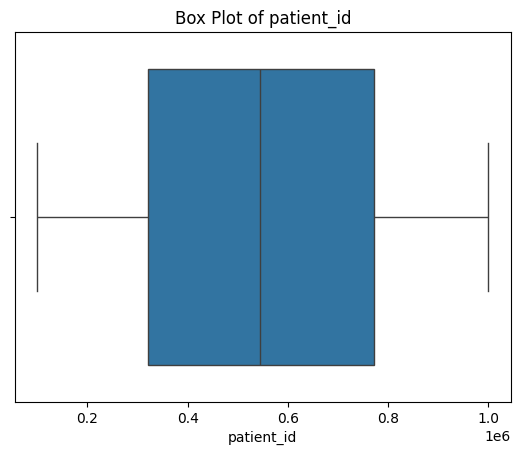

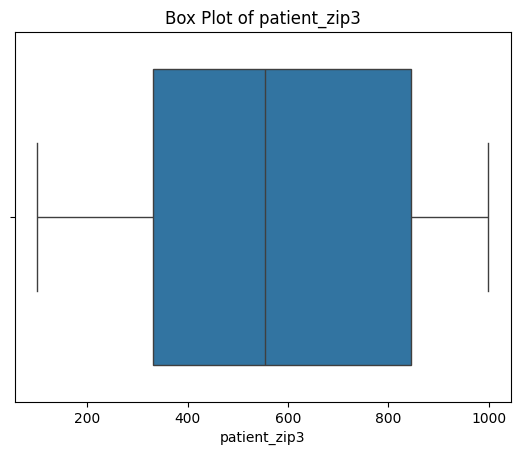

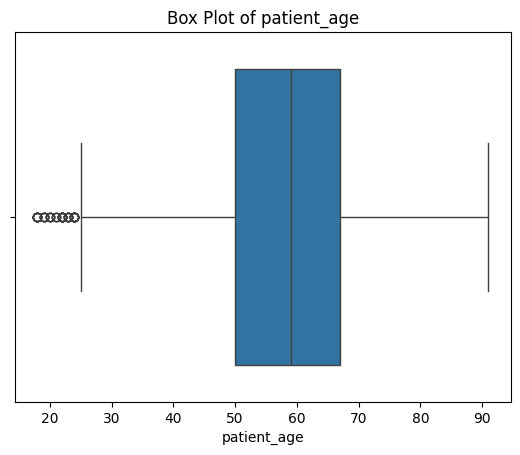

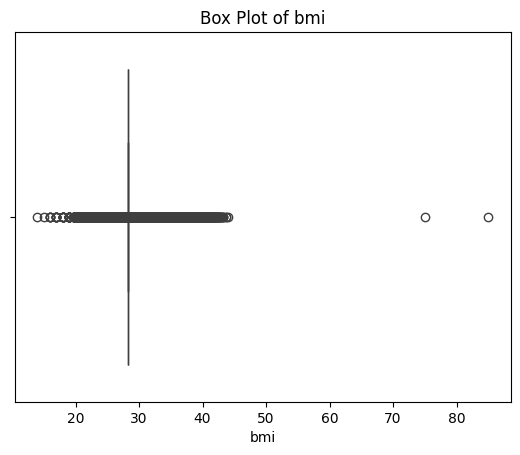

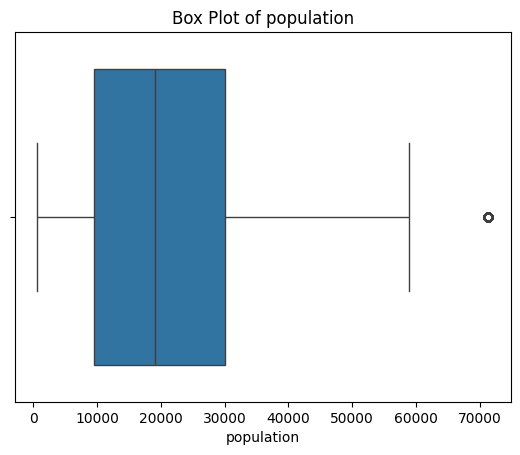

...

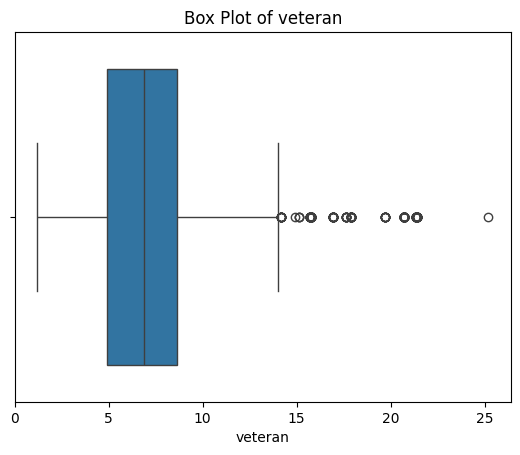

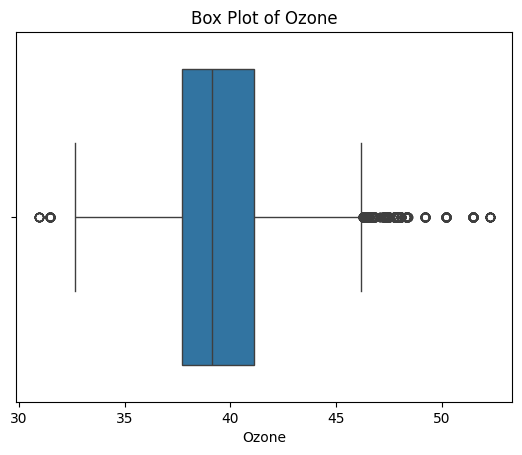

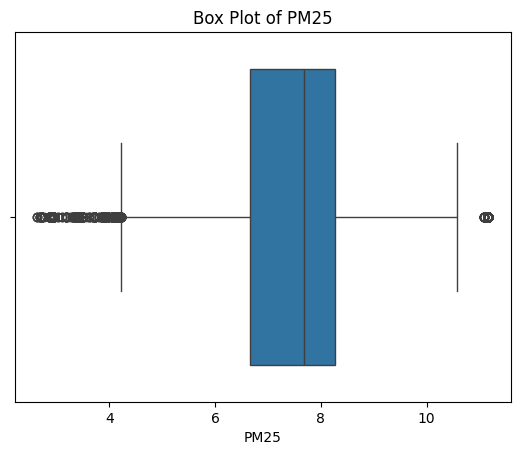

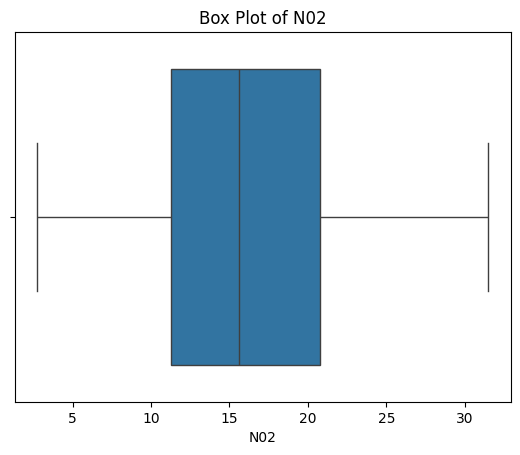

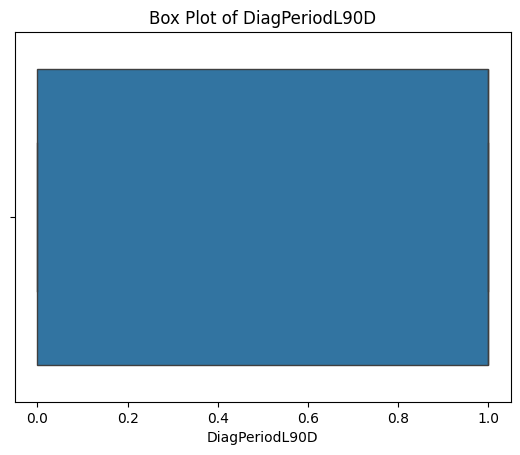

In [15]:
##Checking for outliers
for col in df.select_dtypes(include=['number']).columns:
  plt.figure()
  sns.boxplot(x=df[col])
  plt.title(f"Box Plot of {col}")
  plt.show()

In [16]:
num_columns=df.select_dtypes(include=np.number).columns
correlation_matrix=df[num_columns].corr()
print(correlation_matrix)

                patient_id  patient_zip3  patient_age       bmi  population  \
patient_id        1.000000      0.020582     0.008109 -0.003337    0.001227   
patient_zip3      0.020582      1.000000    -0.062820 -0.025671    0.098974   
patient_age       0.008109     -0.062820     1.000000 -0.034802   -0.018034   
bmi              -0.003337     -0.025671    -0.034802  1.000000   -0.016984   
population        0.001227      0.098974    -0.018034 -0.016984    1.000000   
...                    ...           ...          ...       ...         ...   
veteran          -0.004940      0.038641     0.002477  0.016266   -0.500772   
Ozone            -0.007319      0.389640    -0.025823 -0.011100    0.081526   
PM25              0.011330     -0.066421    -0.023035  0.002564    0.385093   
N02               0.004651     -0.073817     0.014863 -0.020251    0.672276   
DiagPeriodL90D    0.002405      0.036372     0.055634 -0.009052   -0.006564   

                 density  age_median  age_under_10 

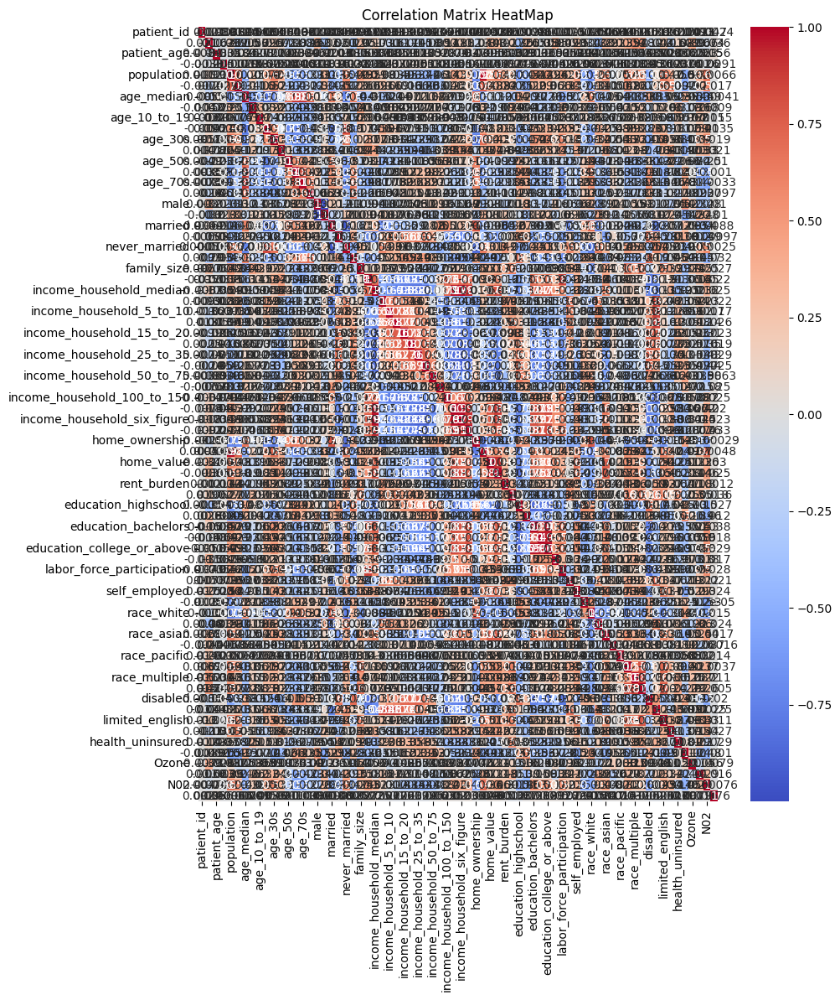

In [17]:
### plotting a Heatmap
plt.figure(figsize=(10,12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix HeatMap')
plt.show()

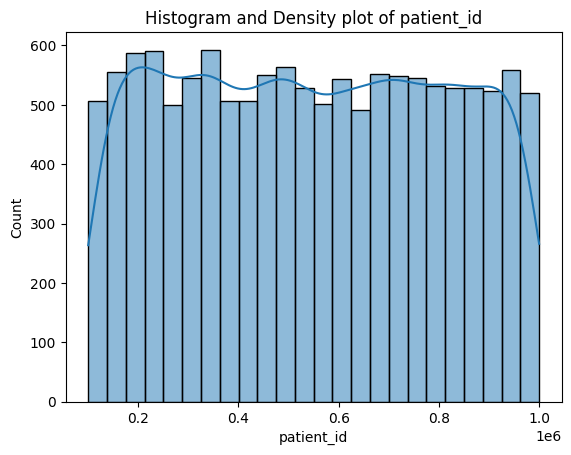

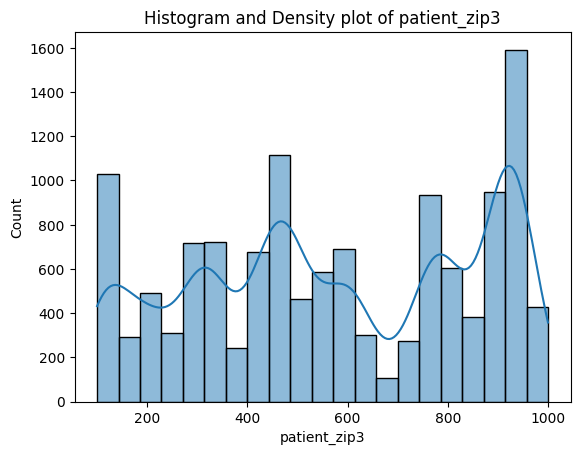

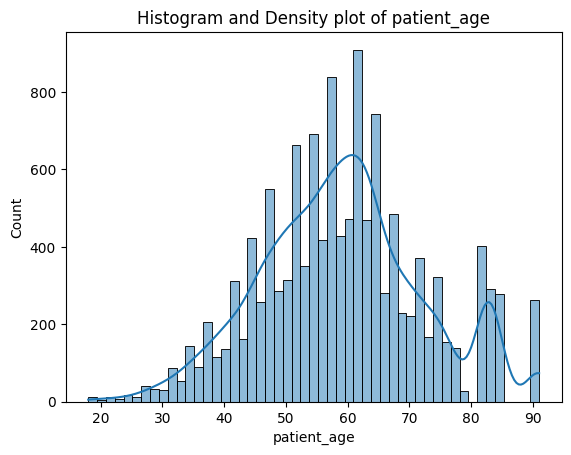

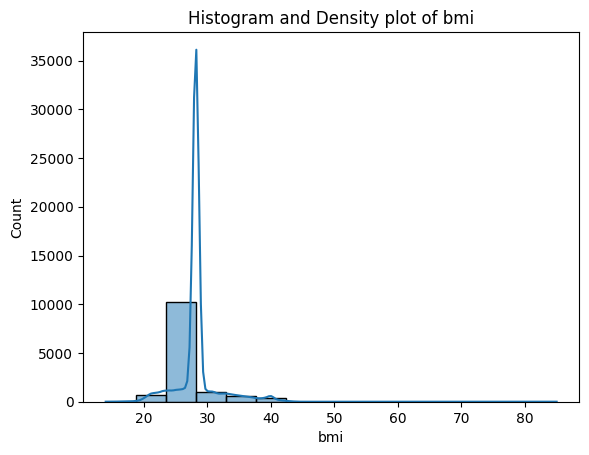

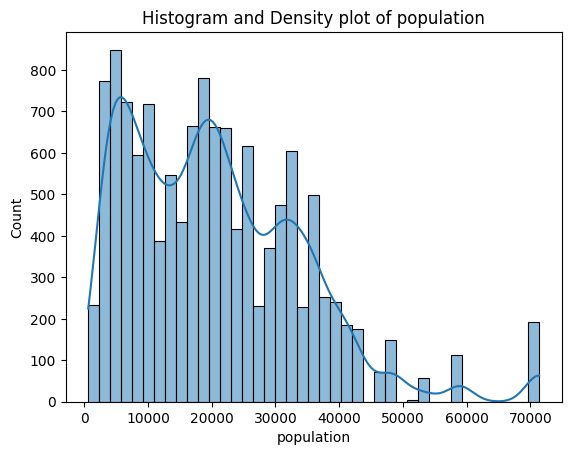

...

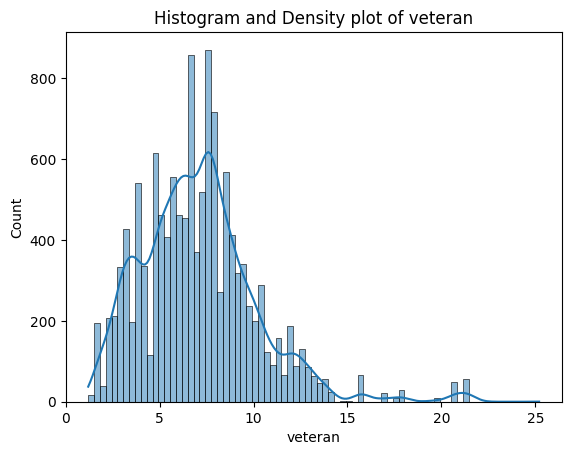

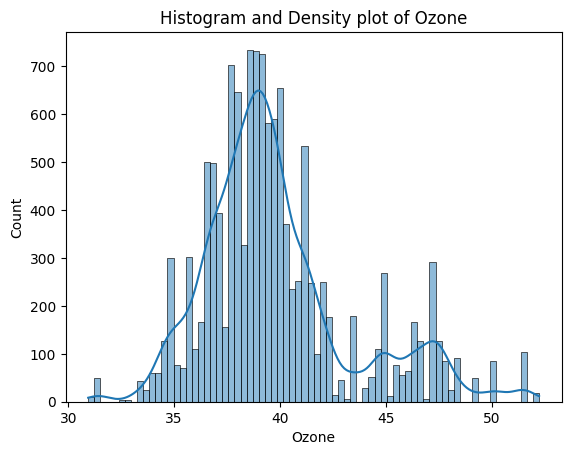

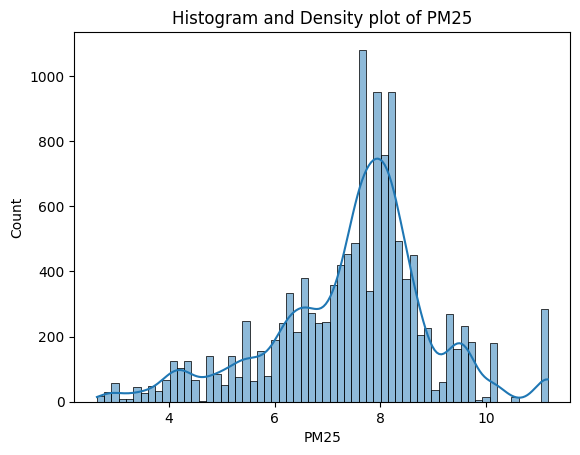

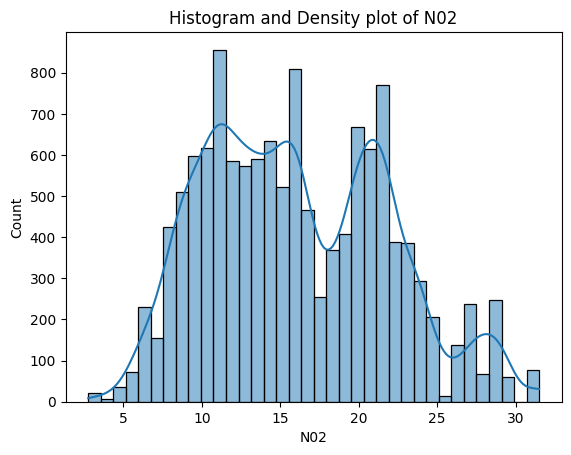

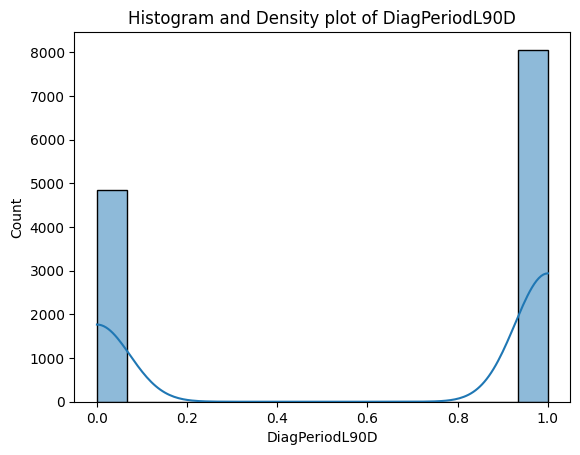

In [18]:
### Plotting a histogram 
for col in df.select_dtypes(include=['number']).columns:
  plt.figure()
  sns.histplot(df[col], kde=True)
  plt.title(f"Histogram and Density plot of {col}")
  plt.show()
  plt.close()

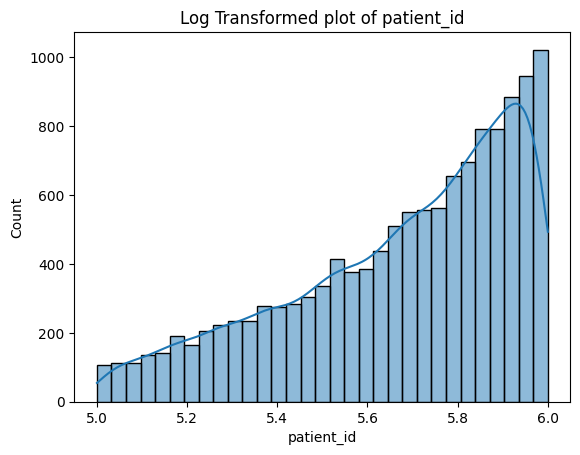

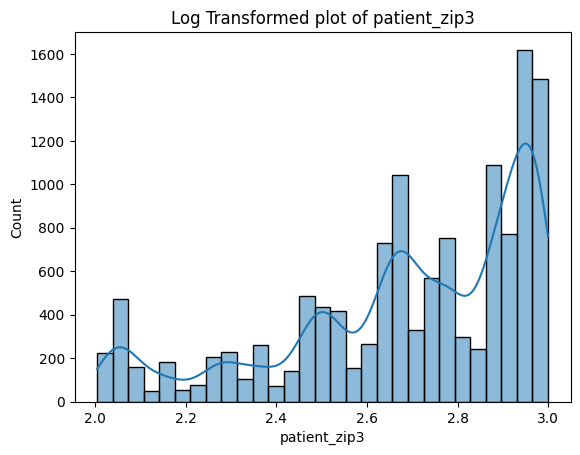

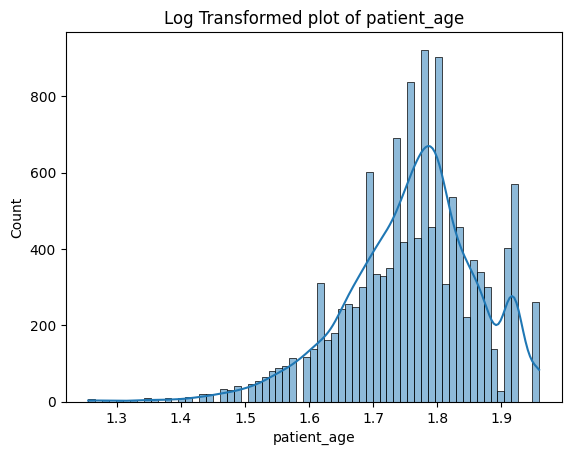

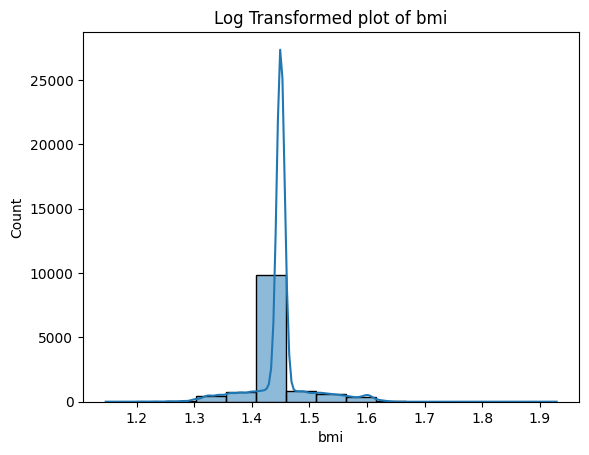

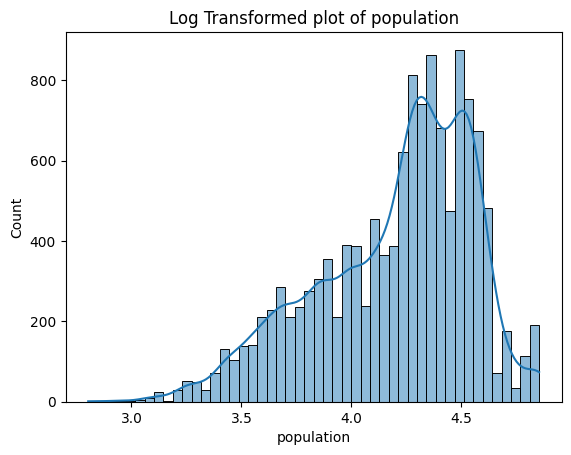

...

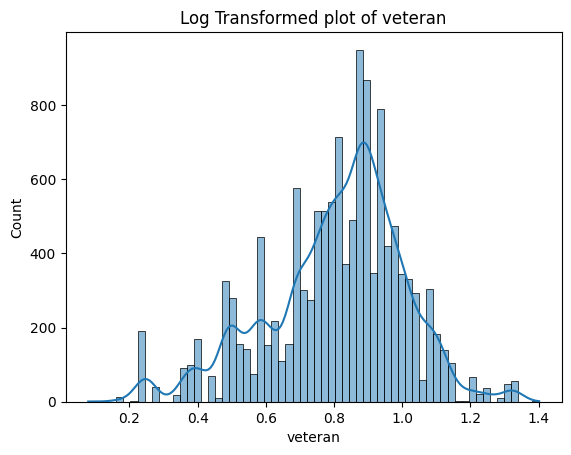

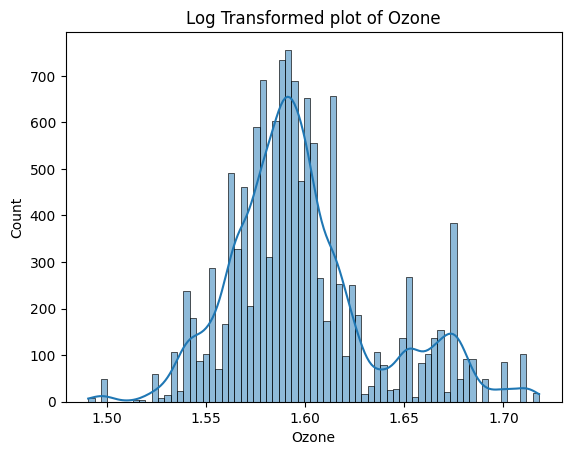

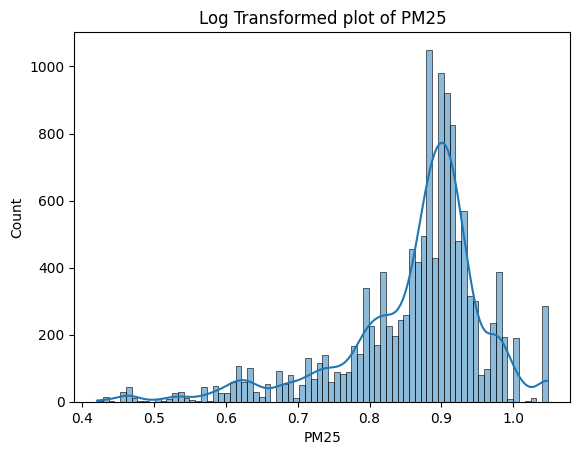

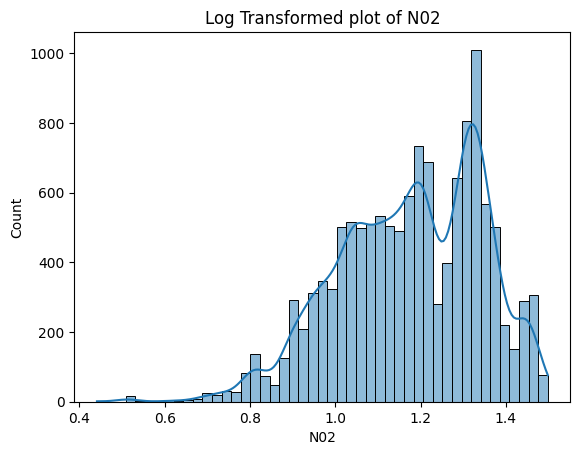

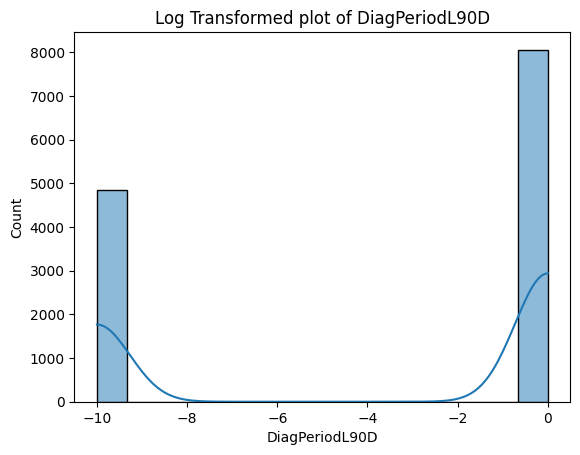

In [19]:
### Handling outliers with log transformation
import numpy as np
for col in df.select_dtypes(include=['number']).columns:
    if (df[col] <= 0).any():
        df[col] = df[col] + 1e-10
    log_transformed_data = np.log10(df[col])
    plt.figure()
    sns.histplot(log_transformed_data, kde=True)
    plt.title(f"Log Transformed plot of {col}")
    plt.show()
    plt.close()

### **Binary Classification Model**

In [20]:
!pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable


In [21]:
import sklearn
from sklearn.preprocessing import LabelEncoder

In [22]:
### Camparing my features binary calssification
label_encoder = LabelEncoder()
###Encoding obj to num
for col in df.select_dtypes(include=['object']).columns:
    df[col] = label_encoder.fit_transform(df[col])

In [23]:
df.head()

,patient_id,patient_race,payer_type,patient_state,patient_zip3,patient_age,patient_gender,bmi,breast_cancer_diagnosis_code,breast_cancer_diagnosis_desc,...,disabled,poverty,limited_english,commute_time,health_uninsured,veteran,Ozone,PM25,N02,DiagPeriodL90D
0,475714,4,1,4,924,84,0,28.19,48,42,...,12.871429,22.542857,10.100000,27.814286,11.200000,3.500000,52.237210,8.650555,18.606528,1.000000e+00
1,349367,4,0,4,928,62,0,28.49,29,12,...,8.957576,10.109091,8.057576,30.606061,7.018182,4.103030,42.301121,8.487175,20.113179,1.000000e+00
2,138632,4,0,43,760,43,0,38.09,18,23,...,11.253333,9.663333,3.356667,31.394915,15.066667,7.446667,40.108207,7.642753,14.839351,1.000000e+00
3,617843,4,0,4,926,45,0,28.19,22,4,...,8.845238,8.688095,5.280952,27.561905,4.404762,4.809524,42.070075,7.229393,15.894123,1.000000e-10
4,817482,4,0,13,836,55,0,28.19,7,18,...,15.276000,11.224000,1.946000,26.170213,12.088000,13.106000,41.356058,4.110749,11.722197,1.000000e-10


[1.e-10 1.e+00] [4846 8060]


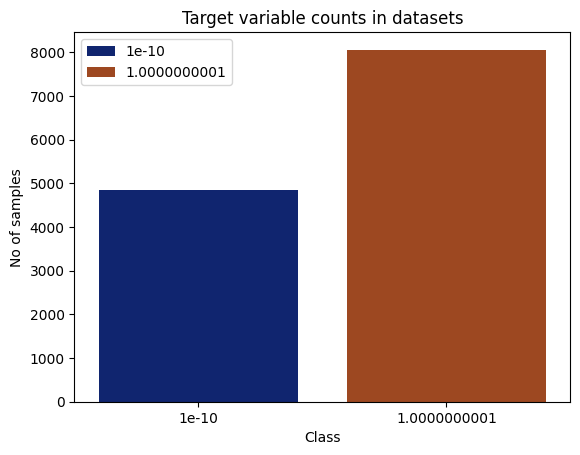

In [35]:
### Checking and plotting for the class in the target variable 
(unique, counts) = np.unique(df['DiagPeriodL90D'], return_counts=True)
print(unique, counts)
sns.barplot(x=unique, y=counts, hue=unique, palette='dark', legend=True)
plt.xlabel("Class")
plt.ylabel("No of samples")
plt.xticks()
plt.title("Target variable counts in datasets")
plt.show()
plt.close()

Number of samples in category 0 4846
Number of samples in category 1: 8060


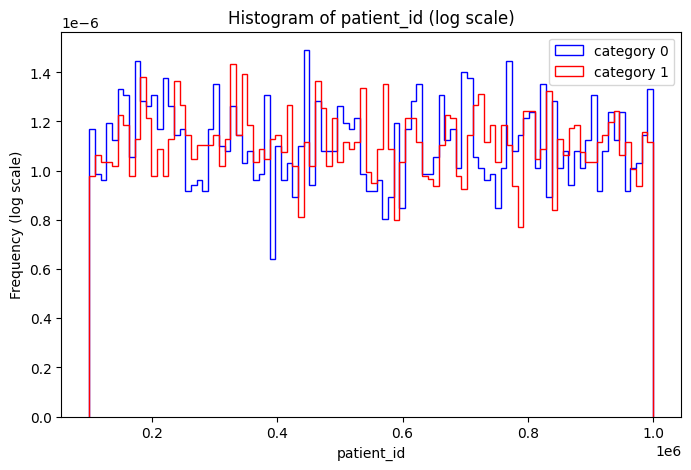

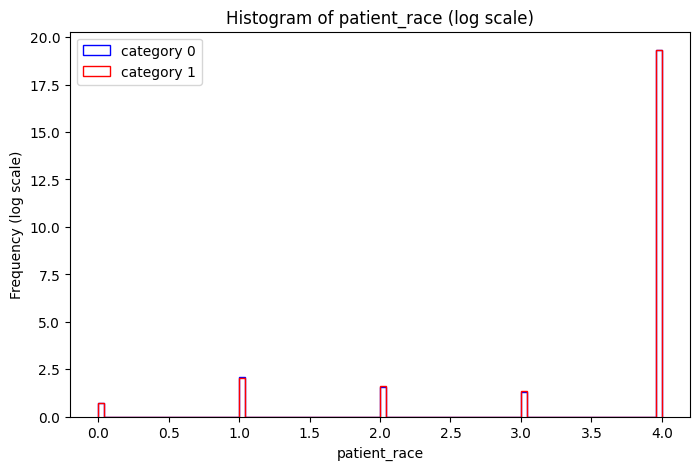

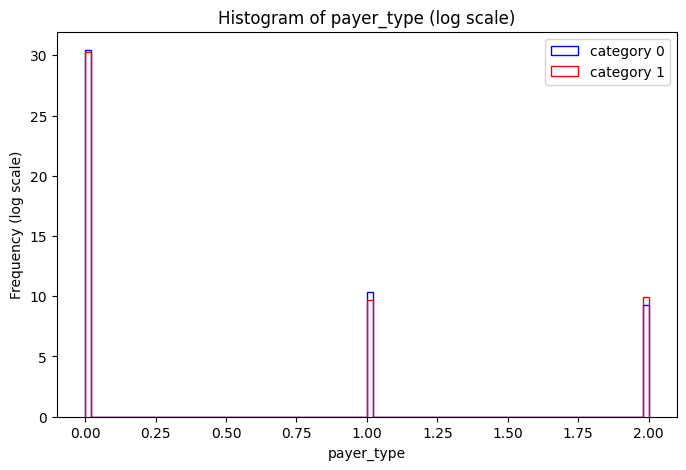

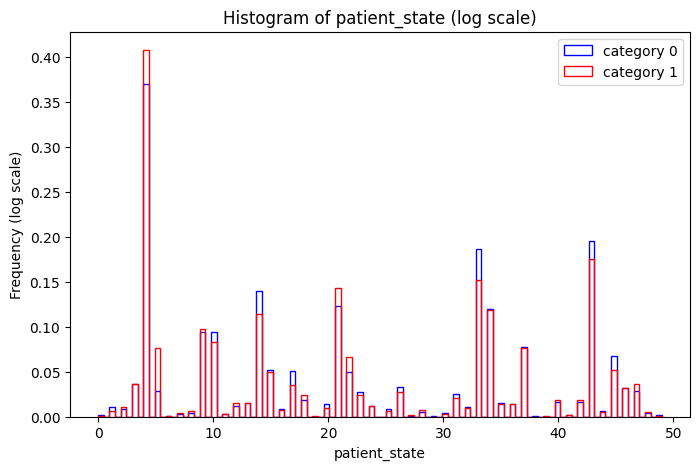

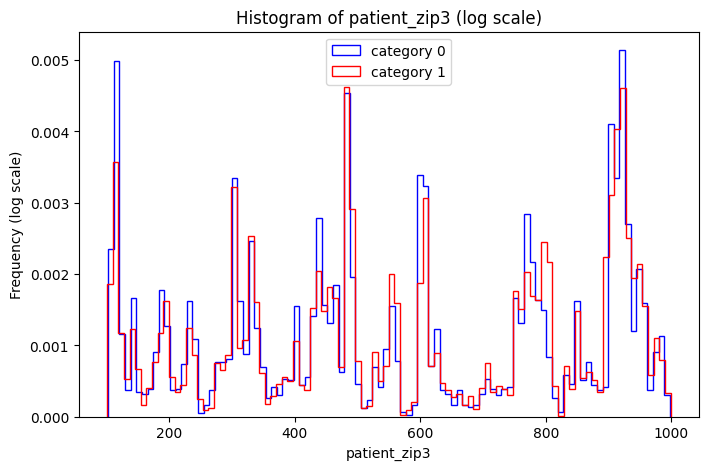

...

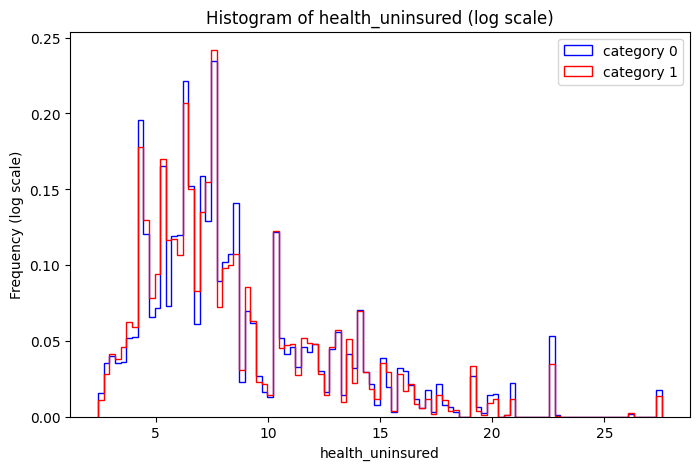

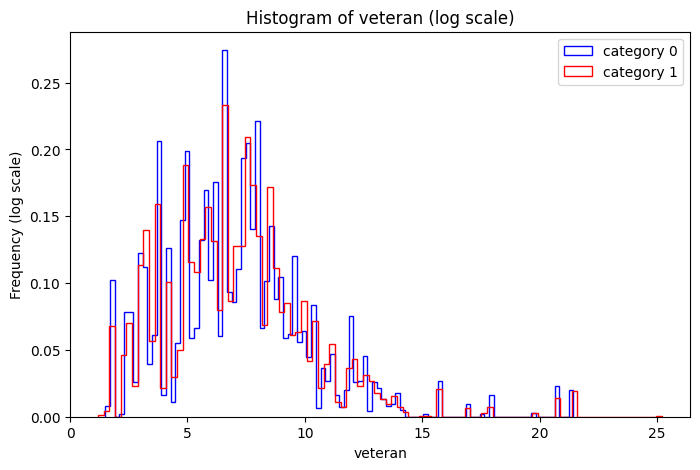

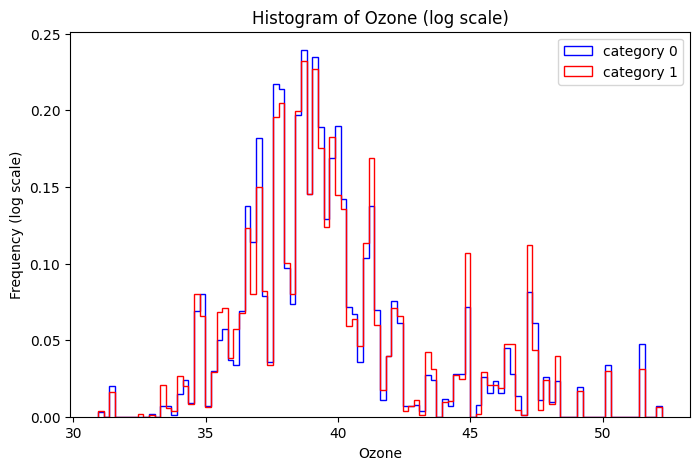

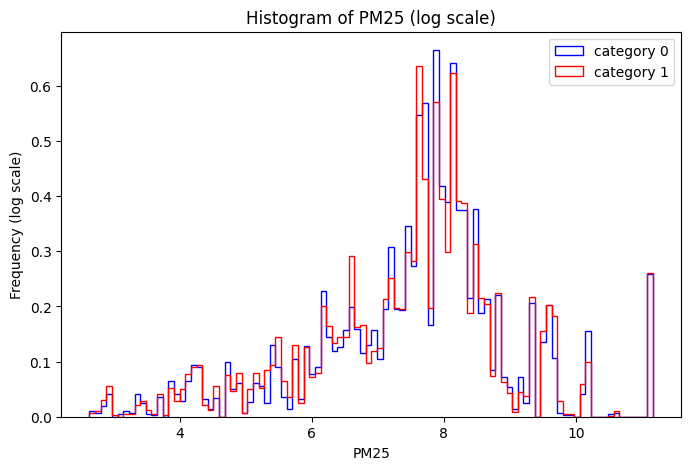

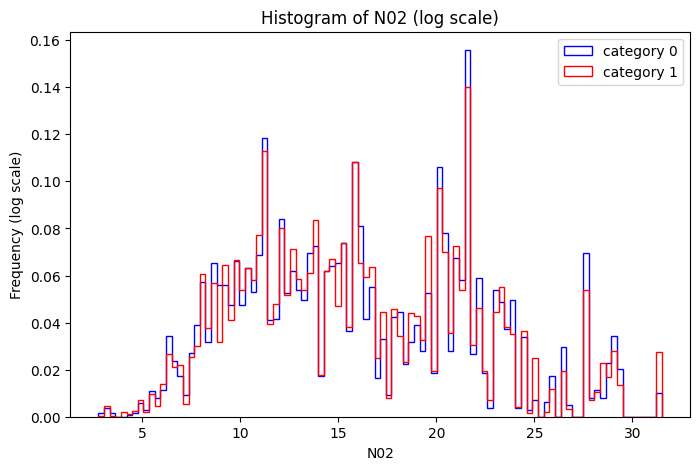

In [45]:
###Comparing the variables for the target categories using a histogram
# Split data based on categories
category_0 = df[df['DiagPeriodL90D'] == 1e-10]
category_1= df[df['DiagPeriodL90D'] == 1.0000000001]
print("Number of samples in category 0", len(category_0))
print("Number of samples in category 1:", len(category_1))

# Histograms for each feature
for feature in df.columns[:-1]: 
    plt.figure(figsize=(8, 5))
    plt.hist(category_0[feature],bins=100, histtype="step", color="blue",label="category 0",density=1, stacked=True)
    plt.hist(category_1[feature],bins=100, histtype="step", color="red",label="category 1",density=1, stacked=True)
    plt.xlabel(feature)
    plt.ylabel('Frequency (log scale)')
    plt.title('Histogram of {} (log scale)'.format(feature))
    plt.legend()
    plt.show()

In [76]:
### Using variance thresholding to figure out which features hold the most & leaving out d ones w/ least info
from sklearn.feature_selection import VarianceThreshold

# Exracting the target varible
y = df['DiagPeriodL90D']

# Separating numerical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Extracting numerical data
x_numeric = df[num_cols]

# Applying variance thresholding
threshold = 0.1 
selector = VarianceThreshold(threshold=threshold)
x_selected = selector.fit_transform(x_numeric)

# Getting the selected columns after variance thresholding
selected_cols = x_numeric.columns[selector.get_support()]

# Creating a data frame with selected columns
data_selected = pd.DataFrame(data=x_selected, columns=selected_cols)

print("Number of selected colums: " , len(selected_cols))
print("Selected Columns:", selected_cols)

Number of selected colums:  79
Selected Columns: Index(['patient_id', 'patient_race', 'payer_type', 'patient_state',
       'patient_zip3', 'patient_age', 'bmi', 'breast_cancer_diagnosis_code',
       'breast_cancer_diagnosis_desc', 'metastatic_cancer_diagnosis_code',
       'Region', 'Division', 'population', 'density', 'age_median',
       'age_under_10', 'age_10_to_19', 'age_20s', 'age_30s', 'age_40s',
       'age_50s', 'age_60s', 'age_70s', 'age_over_80', 'male', 'female',
       'married', 'divorced', 'never_married', 'widowed', 'family_dual_income',
       'income_household_median', 'income_household_under_5',
       'income_household_5_to_10', 'income_household_10_to_15',
       'income_household_15_to_20', 'income_household_20_to_25',
       'income_household_25_to_35', 'income_household_35_to_50',
       'income_household_50_to_75', 'income_household_75_to_100',
       'income_household_100_to_150', 'income_household_150_over',
       'income_household_six_figure', 'income_ind

In [75]:
### Training my datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Spliting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data_selected, y, test_size=0.2, random_state=42)

# Initializing and training the machine learning model
model = LinearRegression()  
model.fit(X_train, y_train)

# Predicting the target variable for the test set
y_pred = model.predict(X_test)

# Evaluate model's performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print('Mean Squared Error:', mse)
print('R-squared:', r2)

# Interpret model's coefficients
coefficients = model.coef_
intercept = model.intercept_
print('Coefficients:', coefficients)
print('Intercept:', intercept)

Mean Squared Error: 5.9527828483126314e-24
R-squared: 1.0
Coefficients: [-4.57981571e-22 -5.23483641e-15 -1.34453910e-14 -1.02916536e-15
  2.13791116e-17  5.50341023e-16  1.45716772e-14 -7.28583860e-16
  2.46330734e-16  3.25260652e-16 -3.92507207e-14  1.44328993e-15
  3.05745013e-17  1.04083409e-17  2.51604293e-14 -2.14238349e-15
  6.54858112e-15  5.41927614e-15  3.00731662e-14  1.27606259e-14
 -1.40373824e-14 -2.90739655e-15 -4.30211422e-14  7.49400542e-15
 -6.56349974e-14 -4.87110352e-14  1.69309011e-14  8.31279490e-15
  1.78468351e-14 -9.82547377e-15 -1.93456362e-14 -2.77555756e-17
  1.60982339e-14  7.91033905e-16  1.70644748e-14 -1.61468061e-14
  2.38108144e-14 -8.18789481e-16  3.88578059e-16 -9.82547377e-15
 -4.35068648e-15 -7.49920959e-14 -5.18682319e-14  4.90059382e-14
 -6.93889390e-18  1.02973186e-14  0.00000000e+00  1.04083409e-17
 -3.98986399e-17 -6.24500451e-15  2.17395546e-14  2.43902121e-14
  1.84297022e-14  1.14399809e-13  1.15220333e-13 -9.29274019e-14
  1.74200931e-14  